### VegNet - Image Classification

India's largest fresh produce supply chain company is a pioneer in solving one of the toughest supply chain challenges by leveraging innovative technology. They source fresh produce from farmers and deliver it to businesses within 12 hours. An integral component of their automation process involves developing robust classifiers that can distinguish between images of different types of vegetables, as well as accurately label images that do not contain any specific type of vegetable as noise.

As a starting point, The company has provided us with a dataset scraped from the web which contains train and test folders, each having 4 sub-folders with images of onions, potatoes, tomatoes and some market scenes. We have been tasked with preparing a multiclass classifier for identifying these vegetables. The dataset provided has all the required images to achieve the task.

**Dataset Link:** https://drive.google.com/file/d/1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT/view?usp=sharing

**Context**

This dataset contains images of the following food items: noise-Indian market and images of vegetables- onion, potato and tomato.

**Data Collection**

The images in this dataset were scraped from Google.

**Content**

This dataset contains a folder train, which has a total of 3135 images, split into four folders as follows:

Tomato : 789

Potato : 898

Onion : 849

Indian market : 599

This dataset contains another folder test which has a total of 351 images, split into four folders

Tomato : 106

potato : 83

onion : 81

Indian market : 81

##### Objective:

The objective is to develop a program that can recognize the vegetable item(s) in a photo and identify them for the user.

##### Importing necessary libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
import keras

###### Loading the dataset

In [2]:
main_directory='./ninjacart_data/ninjacart_data'
train_data,validation_data = tf.keras.utils.image_dataset_from_directory(directory=f'{main_directory}/train',label_mode='categorical',shuffle=True,validation_split=0.2,subset='both',seed=42)
test_data = tf.keras.utils.image_dataset_from_directory(directory=f'{main_directory}/test',label_mode='categorical',shuffle=False)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Using 627 files for validation.
Found 351 files belonging to 4 classes.


Unique Classes in the dataset

In [3]:
train_data.class_names

['indian market', 'onion', 'potato', 'tomato']

The dataset contains different images of markets in India and vegetables like Onion, Potato, and Tomato.

##### Checking the number of images under each class

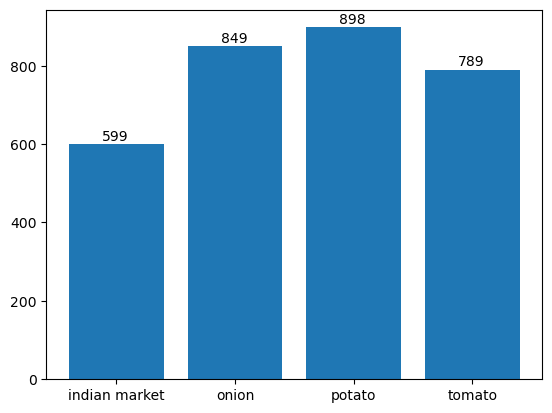

In [4]:
import os
class_files = {}
for classes in train_data.class_names:
    directory = f'{main_directory}/train/{classes}'
    num_files = len(os.listdir(directory))
    class_files[classes] = num_files
print()
ax = plt.bar(x=class_files.keys(),height=class_files.values())
for patch in ax.patches:
    plt.annotate(patch.get_height(),(patch.get_x()+patch.get_width()*0.35,patch.get_height()+10))
plt.show()

From the above, we can see that there are about 599 images under Indian market class, 849 images under Onion class, 898 images under Potato class and about 789 images under Tomato class.

In [5]:
class_files

{'indian market': 599, 'onion': 849, 'potato': 898, 'tomato': 789}

These are split into training and validation dataset to train and validate the CNN model. 

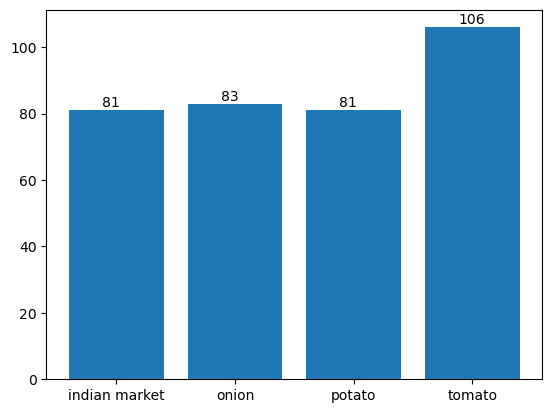

In [6]:
test_files = {}
for classes in test_data.class_names:
    directory = f'{main_directory}/test/{classes}'
    num_files = len(os.listdir(directory))
    test_files[classes] = num_files
print()
ax = plt.bar(x=test_files.keys(),height=test_files.values())
for patch in ax.patches:
    plt.annotate(patch.get_height(),(patch.get_x()+patch.get_width()*0.35,patch.get_height()+1))
plt.show()

And in the Testing dataset, there are about 81 images under Indian market class, 83 images under Onion class, 81 images under Potato class and about 106 images under Tomato class.

##### Displaying few samples of the dataset

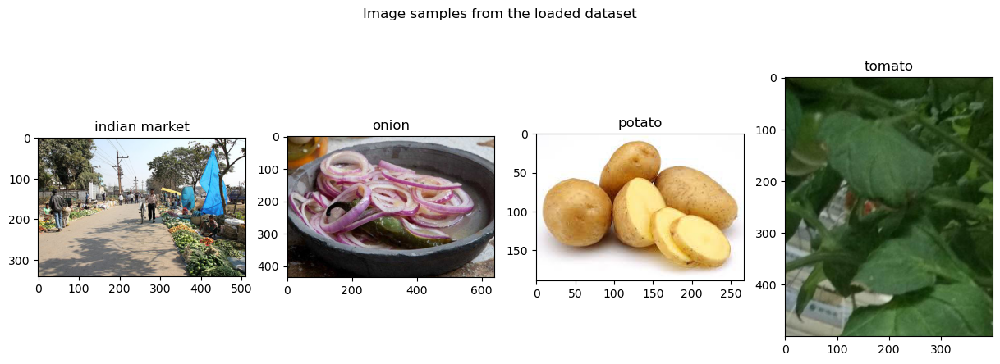

In [7]:
import os
num=1
plt.figure(figsize=(15,5))
for classes in train_data.class_names:
    directory = f'{main_directory}/train/{classes}'
    files = os.listdir(directory)
    img=files[-1]
    img = tf.keras.preprocessing.image.load_img(f'{directory}/{img}')
    plt.suptitle('Image samples from the loaded dataset')
    plt.subplot(1,4,num)
    plt.title(f'{classes}')
    plt.imshow(img)
    num+=1
    if num>=5:
        break
plt.show()

##### Display 5 Samples under each classes present in the dataset

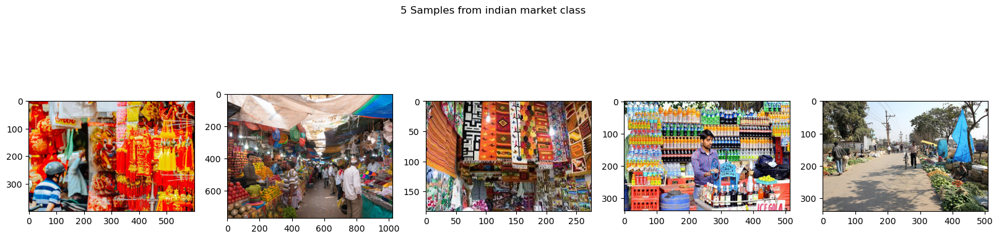

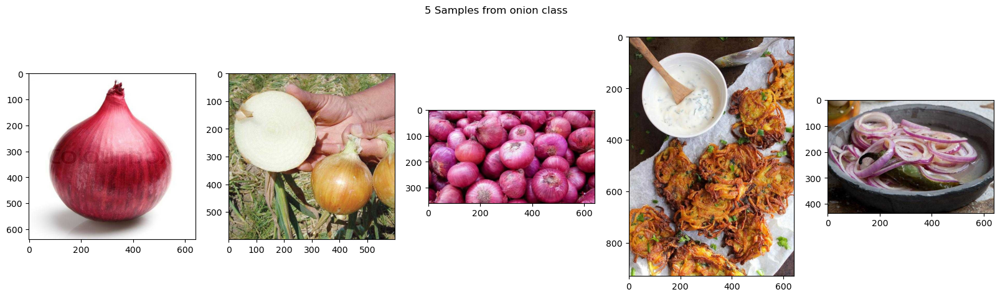

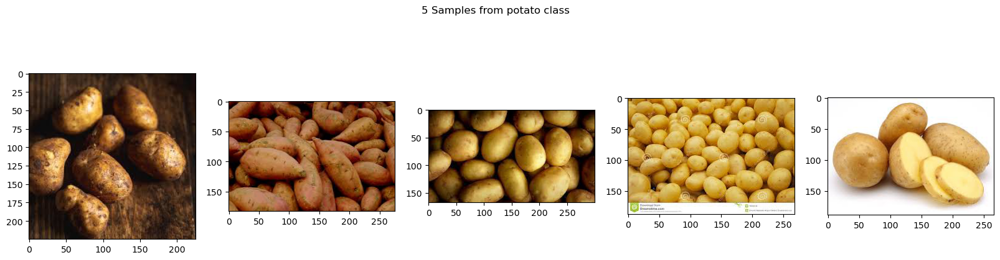

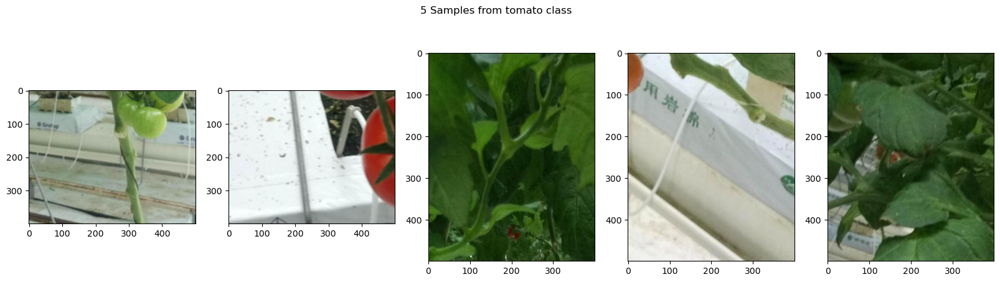

In [8]:
num=1
for classes in train_data.class_names:
    directory = f'{main_directory}/train/{classes}'
    files = os.listdir(directory)
    images=files[-5:]
    images = [tf.keras.preprocessing.image.load_img(f'{directory}/{img}') for img in images]
    plt.figure(figsize=(20,5))
    for i in range(len(images)):
        plt.suptitle(f'5 Samples from {classes} class')
        plt.subplot(1,5,i+1)
        plt.imshow(images[i])

    plt.show()

##### Plotting images to check their dimensions

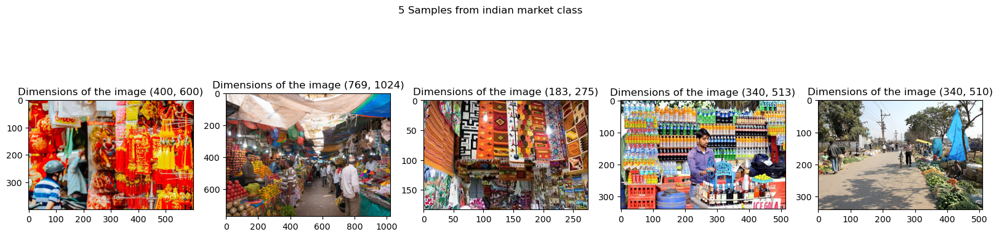

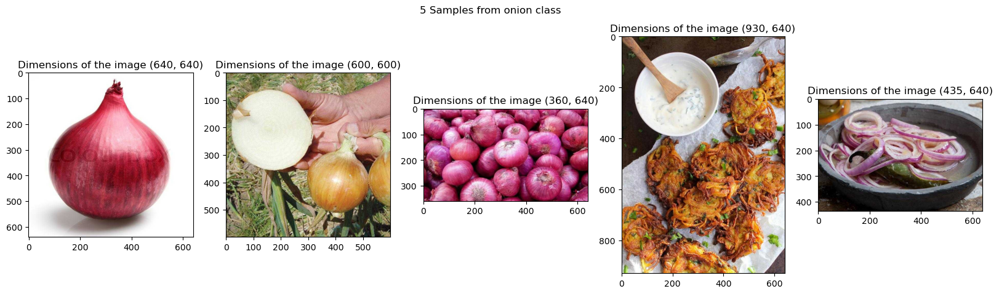

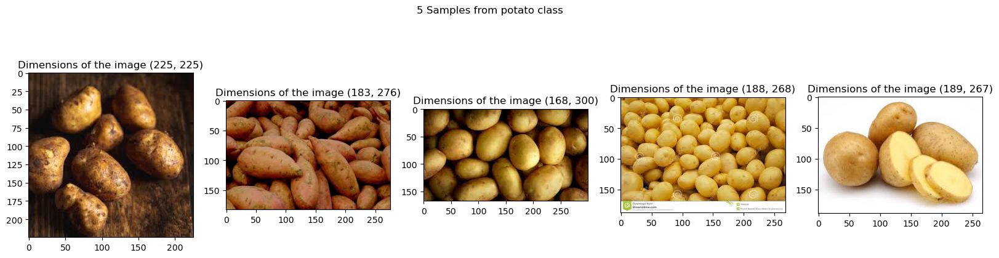

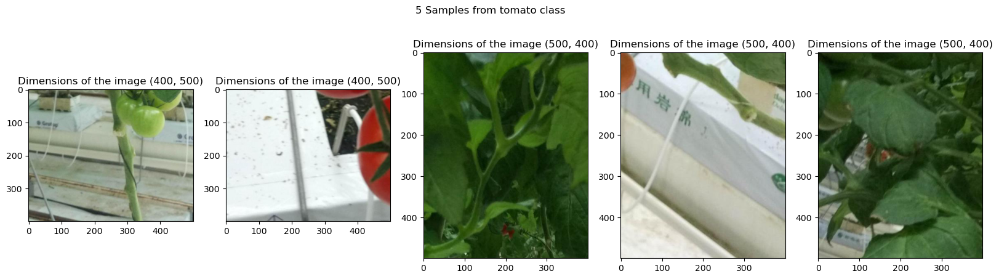

In [9]:
num=1
for classes in train_data.class_names:
    directory = f'{main_directory}/train/{classes}'
    files = os.listdir(directory)
    images=files[-5:]
    images = [tf.keras.preprocessing.image.load_img(f'{directory}/{img}') for img in images]
    plt.figure(figsize=(20,5))
    for i in range(len(images)):
        plt.suptitle(f'5 Samples from {classes} class')
        img_height=images[i].height
        img_width=images[i].width
        plt.subplot(1,5,i+1)
        plt.title(f'Dimensions of the image {(img_height,img_width)}')
        plt.imshow(images[i])

    plt.show()

From the above plot, we can see that the dimensions of the images are not same. The dimensions has to be same inorder to train the CNN model

##### Defining the Preprocessing steps for the images.

Lets keep the dimensions of the image restricted to 128 X 128. ie: Height = 128 and Width = 128. Then also perform rescale operation to restrict the pixel values between 0 and 1.

In [10]:
from tensorflow.keras.layers import Resizing, Rescaling
from tensorflow.keras.models import Sequential

In [11]:
def preprocess_image(train_data,validation_data,test_data,height=128,width=128):
    img_preprocess = Sequential(name='preprocess_image')
    img_preprocess.add(Resizing(height=height,width=width))
    img_preprocess.add(Rescaling(1.0/255))
    
    train_ds = train_data.map(lambda x,y : (img_preprocess(x),y),num_parallel_calls=tf.data.AUTOTUNE)
    validation_ds = validation_data.map(lambda x,y:(img_preprocess(x),y),num_parallel_calls=tf.data.AUTOTUNE)
    test_ds = test_data.map(lambda x,y:(img_preprocess(x),y),num_parallel_calls=tf.data.AUTOTUNE)
    
    return train_ds,validation_ds,test_ds

In [12]:
train_ds,validation_ds,test_ds = preprocess_image(train_data,validation_data,test_data)

##### Lets store each of the model architectures in a dictionary

Lets store each of built model in a dictionary so that it would be easier for us to compare the results during inference.

In [13]:
built_models = {}

##### Building the CNN Model 

Lets build a Simple CNN model using the keras sequential API with convolution layers to do the image classification.

In [14]:
def model_arch1(height=128,width=128,channels=3):
    model = Sequential(
        name='cnn_model1',
        layers = [
            tf.keras.layers.Conv2D(filters=16,kernel_size=3,activation='relu',use_bias=True,input_shape=(height,width,channels)),
            tf.keras.layers.MaxPooling2D(),
            tf.keras.layers.Conv2D(filters=32,kernel_size=3,activation='relu',use_bias=True),
            tf.keras.layers.MaxPooling2D(),
            tf.keras.layers.Conv2D(filters=64,kernel_size=3,activation='relu',use_bias=True),
            tf.keras.layers.MaxPooling2D(),
            tf.keras.layers.Conv2D(filters=128,kernel_size=3,activation='relu',use_bias=True),
            tf.keras.layers.MaxPooling2D(),
            tf.keras.layers.Conv2D(filters=256,kernel_size=3,activation='relu',use_bias=True),
            tf.keras.layers.MaxPooling2D(),
            tf.keras.layers.GlobalAveragePooling2D(),   #Convolutional layers end here.
            tf.keras.layers.Dense(units=128,activation='relu',use_bias=True),
            tf.keras.layers.Dense(units=64,activation='relu',use_bias=True),
            tf.keras.layers.Dense(units=4,activation='softmax',use_bias=True) 
        ]
        )
    return model

In [15]:
model = model_arch1()
model.summary()

C:\Anaconda\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "cnn_model1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 12, 12, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 6, 6, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 4, 4, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 2, 2, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 4)                   │             260 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 434,020 (1.66 MB)

 Trainable params: 434,020 (1.66 MB)

 Non-trainable params: 0 (0.00 B)

###### Visualizing the model

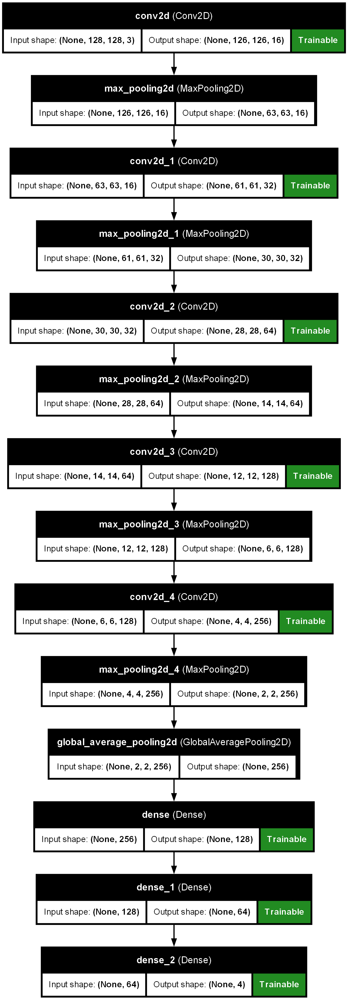

In [16]:
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_names=True,show_trainable=True)

###### Compiling the model

In [17]:
model.compile(optimizer='adam',loss=tf.keras.losses.CategoricalCrossentropy(),metrics=['accuracy'])

##### Fitting the model with callbacks

In [18]:
direc = './model1_callbacks'
model_chkpt = tf.keras.callbacks.ModelCheckpoint(filepath=f'{direc}/model1_chkpt/best_model.weights.h5',monitor='val_accuracy',mode='max',save_best_only=True,save_weights_only=True,verbose=1)
model_tensorboard = tf.keras.callbacks.TensorBoard(log_dir=f'{direc}/model1_tensorboard',write_graph=True,write_images=True)
model_earlyStopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',min_delta=0.001,patience=10,mode='min')

In [19]:
fitted_model = model.fit(train_ds,validation_data=validation_ds,epochs=32,batch_size=10,callbacks=[model_chkpt,model_tensorboard,model_earlyStopping])

Epoch 1/32
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.3784 - loss: 1.2318
Epoch 1: val_accuracy improved from -inf to 0.60287, saving model to ./model1_callbacks/model1_chkpt/best_model.weights.h5
79/79 ━━━━━━━━━━━━━━━━━━━━ 36s 359ms/step - accuracy: 0.3799 - loss: 1.2298 - val_accuracy: 0.6029 - val_loss: 0.8367
Epoch 2/32
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.7020 - loss: 0.7240
Epoch 2: val_accuracy improved from 0.60287 to 0.74003, saving model to ./model1_callbacks/model1_chkpt/best_model.weights.h5
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - accuracy: 0.7023 - loss: 0.7232 - val_accuracy: 0.7400 - val_loss: 0.6048
Epoch 3/32
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.7627 - loss: 0.6043
Epoch 3: val_accuracy did not improve from 0.74003
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - accuracy: 0.7627 - loss: 0.6044 - val_accuracy: 0.7049 - val_loss: 0.7020
Epoch 4/32
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.7795 - loss: 0.5414
Ep

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - accuracy: 0.9249 - loss: 0.1933 - val_accuracy: 0.8501 - val_loss: 0.3494
Epoch 25/32
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - accuracy: 0.9302 - loss: 0.1813
Epoch 25: val_accuracy did not improve from 0.87400
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 165ms/step - accuracy: 0.9302 - loss: 0.1813 - val_accuracy: 0.8006 - val_loss: 0.5991
Epoch 26/32
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - accuracy: 0.9168 - loss: 0.2393
Epoch 26: val_accuracy improved from 0.87400 to 0.88038, saving model to ./model1_callbacks/model1_chkpt/best_model.weights.h5
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - accuracy: 0.9167 - loss: 0.2393 - val_accuracy: 0.8804 - val_loss: 0.2996
Epoch 27/32
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.9357 - loss: 0.1587
Epoch 27: val_accuracy did not improve from 0.88038
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 165ms/step - accuracy: 0.9356 - loss: 0.1591 - val_accuracy: 0.8517 - val_loss: 0.4089
Epoch 28/32
79/79 ━━━━━━━━━━━━━━━━━━

##### Load the best model

In [20]:
model.load_weights(filepath=f'{direc}/model1_chkpt/best_model.weights.h5')

##### Checking and Plotting Training and Validation accuracy

In [21]:
def annotate_best_accuracy(x,y,xytext,ax=None):
    xmax=x[np.argmax(y)]
    ymax = max(y)
    text = f'{ymax:.2f}%'
    if ax is None:
        ax = plt.gca()
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    arrowprops=dict(arrowstyle="->",connectionstyle="angle,angleA=0,angleB=60")
    kw = dict(xycoords='data',textcoords="axes fraction",
              arrowprops=arrowprops, bbox=bbox_props, ha="right", va="top")
    ax.annotate(text, xy=(xmax, ymax), xytext=xytext, **kw)

In [22]:
def plot_train_val_accuracy(fitted_model):
    epochs = range(0,len(fitted_model.history['accuracy']))
    training_accuracy = [acc*100 for acc in fitted_model.history['accuracy']]
    validation_accuracy = [acc*100 for acc in fitted_model.history['val_accuracy']]
    
    plt.plot(epochs,training_accuracy,label='Training_accuracy',color='red')
    annotate_best_accuracy(epochs,training_accuracy,xytext=(0.8,0.7))
    plt.plot(epochs,validation_accuracy,label='Validation_accuracy',color='blue')
    annotate_best_accuracy(epochs,validation_accuracy,xytext=(0.9,0.6))
    plt.legend()
    plt.title('Accuracy vs Epochs')
    plt.xlabel('epochs')
    plt.ylabel('Accuracy')
    plt.show()

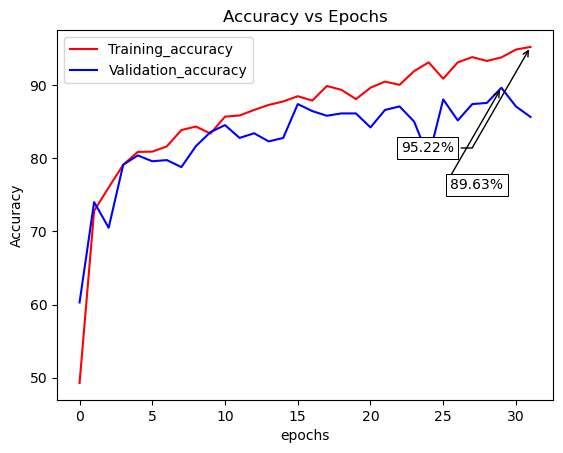

In [23]:
plot_train_val_accuracy(fitted_model)

##### Prediction on the Test dataset.

In [24]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report

In [25]:
def print_accuracy(model,data,show=True):
    true_vals = tf.concat([y for x,y in data],axis=0)
    true_categs = tf.argmax(true_vals,axis=1)
    predicted_vals = model.predict(data,verbose=0)
    predicted_categs = tf.argmax(predicted_vals,axis=1)
    if show:
        print(f'The accuracy of the model on the provided dataset is {accuracy_score(true_categs,predicted_categs)*100:.2f}%')
    return (accuracy_score(true_categs,predicted_categs)*100)

In [26]:
print_accuracy(model,test_ds)

The accuracy of the model on the provided dataset is 79.49%


79.48717948717949

##### Confusion matrix

In [27]:
def print_confusion_matrix(model,data,show_plot):
    true_vals = tf.concat([y for x,y in data],axis=0)
    true_categs = tf.argmax(true_vals,axis=1)
    predictions = model.predict(data,verbose=0)
    predicted_categs = tf.argmax(predictions,axis=1)
    classNames = test_data.class_names
    conf_mat = confusion_matrix(true_categs,predicted_categs)
    if show_plot:
        plt.title('Confusion Matrix')
        conf_heatmap = sns.heatmap(conf_mat,annot=True,xticklabels=classNames,yticklabels=classNames,cmap='GnBu')
        plt.show()
    else:
        return conf_mat

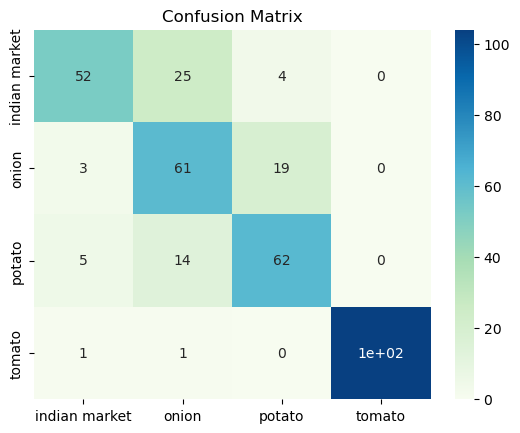

In [28]:
print_confusion_matrix(model,test_ds,show_plot=True)

From the above plots we can clearly see that the model got overfitted with the Training data. We can fine tune this model by including some regularization techniques like kernel regularizers, Batch normalization and Image augmentation. This makes the model more robust to the incoming data.

In [29]:
built_models['basic_model'] = model

##### Incorporating Regularisation Techniques in CNN Model

Implementing Kernel regularisation and Batch Normalisation

In [30]:
from tensorflow.keras.regularizers import L2
def model_arch2(height=128,width=128,channels=3):
    model = Sequential(
        name='cnn_model2',
        layers = [
            tf.keras.layers.Conv2D(filters=16,kernel_size=3,use_bias=True,input_shape=(height,width,channels),kernel_regularizer=L2(1e-3)),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Activation(activation='relu'),
            tf.keras.layers.MaxPooling2D(),
            tf.keras.layers.Conv2D(filters=32,kernel_size=3,use_bias=True,kernel_regularizer=L2(1e-3)),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Activation(activation='relu'),
            tf.keras.layers.MaxPooling2D(),
            tf.keras.layers.Conv2D(filters=64,kernel_size=3,use_bias=True,kernel_regularizer=L2(1e-3)),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Activation(activation='relu'),
            tf.keras.layers.MaxPooling2D(),
            tf.keras.layers.Conv2D(filters=128,kernel_size=3,use_bias=True,kernel_regularizer=L2(1e-3)),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Activation(activation='relu'),
            tf.keras.layers.MaxPooling2D(),
            tf.keras.layers.Conv2D(filters=256,kernel_size=3,use_bias=True,kernel_regularizer=L2(1e-3)),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Activation(activation='relu'),
            tf.keras.layers.MaxPooling2D(),
            tf.keras.layers.GlobalAveragePooling2D(),   #Convolutional layers end here.
            tf.keras.layers.Dense(units=128,use_bias=True,kernel_regularizer=L2(1e-3)),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Activation(activation='relu'),
            tf.keras.layers.Activation(activation='relu'),
            tf.keras.layers.Dense(units=4,activation='softmax',use_bias=True) 
        ]
        )
    return model

In [31]:
model = model_arch2()
model.summary()

C:\Anaconda\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "cnn_model2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 126, 126, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 126, 126, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 126, 126, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 63, 63, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 61, 61, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 61, 61, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 61, 61, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 30, 30, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 28, 28, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 28, 28, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 12, 12, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 12, 12, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 6, 6, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 4, 4, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 4, 4, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 4, 4, 256)           │              

 Total params: 428,516 (1.63 MB)

 Trainable params: 427,268 (1.63 MB)

 Non-trainable params: 1,248 (4.88 KB)

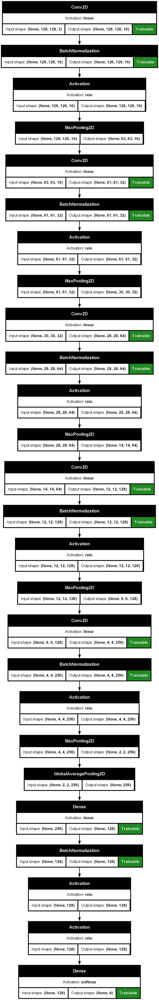

In [32]:
tf.keras.utils.plot_model(model,show_trainable=True,show_shapes=True,show_layer_activations=True)

##### Compiling and fitting the model

In [33]:
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
direc = './model2_callbacks'
model_chkpt = tf.keras.callbacks.ModelCheckpoint(filepath=f'{direc}/model2_chkpt/best_model.weights.h5',monitor='val_accuracy',mode='max',save_best_only=True,save_weights_only=True,verbose=1)
model_tensorboard = tf.keras.callbacks.TensorBoard(log_dir=f'{direc}/model2_tensorboard',write_graph=True,write_images=True)
model_earlyStopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',min_delta=0.001,patience=10,mode='min')
callbacks=[model_chkpt,model_tensorboard,model_earlyStopping]
regularized_fitted_model = model.fit(train_ds,batch_size=32,epochs=10,validation_data=validation_ds,callbacks=callbacks)

Epoch 1/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.7199 - loss: 1.2295
Epoch 1: val_accuracy improved from -inf to 0.26475, saving model to ./model2_callbacks/model2_chkpt/best_model.weights.h5
79/79 ━━━━━━━━━━━━━━━━━━━━ 39s 366ms/step - accuracy: 0.7208 - loss: 1.2275 - val_accuracy: 0.2648 - val_loss: 2.1541
Epoch 2/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step - accuracy: 0.8366 - loss: 0.9015
Epoch 2: val_accuracy improved from 0.26475 to 0.26954, saving model to ./model2_callbacks/model2_chkpt/best_model.weights.h5
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 343ms/step - accuracy: 0.8366 - loss: 0.9015 - val_accuracy: 0.2695 - val_loss: 2.8212
Epoch 3/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step - accuracy: 0.8593 - loss: 0.8245
Epoch 3: val_accuracy improved from 0.26954 to 0.44817, saving model to ./model2_callbacks/model2_chkpt/best_model.weights.h5
79/79 ━━━━━━━━━━━━━━━━━━━━ 28s 346ms/step - accuracy: 0.8593 - loss: 0.8244 - val_accuracy: 0.4482 - val_loss: 2.2770
Epoch 4/10
79

###### Plotting Training and Validation Accuracy

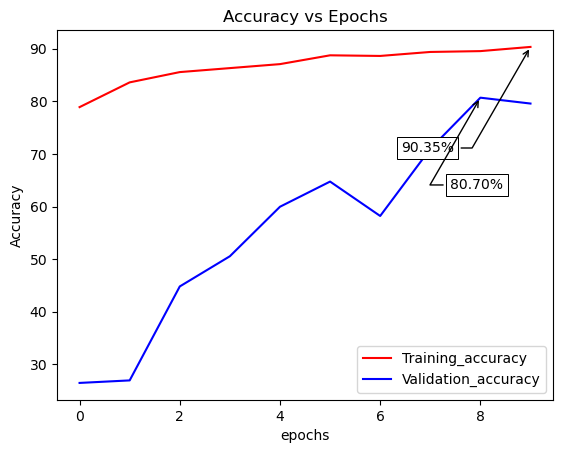

In [34]:
plot_train_val_accuracy(regularized_fitted_model)

##### Testing Accuracy

In [35]:
model.load_weights(filepath=f'{direc}/model2_chkpt/best_model.weights.h5')

In [36]:
basic_model_acc = print_accuracy(model,test_ds)

The accuracy of the model on the provided dataset is 78.35%


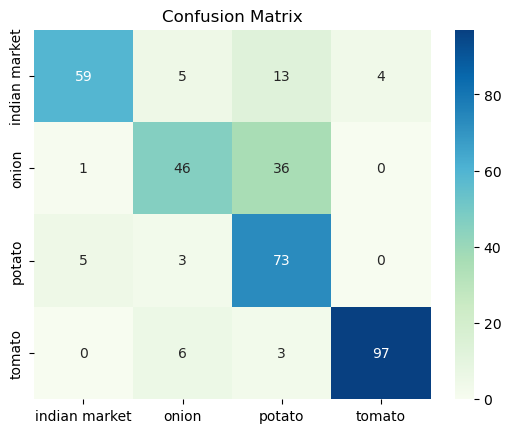

In [37]:
print_confusion_matrix(model,test_ds,show_plot=True)

In [38]:
built_models['regularized_model']=model

#### Including Image Augmentation

Let's import some common augmentation layers from keras library to use it in our Training dataset.

In [39]:
from tensorflow.keras.layers import RandomRotation, RandomFlip, RandomCrop, RandomContrast, RandomTranslation, RandomBrightness

Implementing Augmentation on a sample image

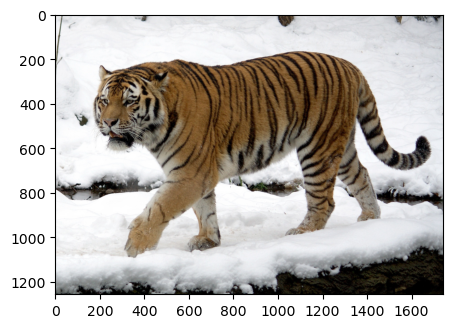

In [40]:
img = tf.keras.preprocessing.image.load_img('./sample_image.jpg')
plt.figure(figsize=(5,5))
plt.imshow(img)
plt.show()

Applying Random Rotation

In [41]:
def apply_augmentation(image,layer,operation):
    img_array = tf.keras.utils.img_to_array(image)
    plt.subplot(1,2,1)
    plt.title('Original image')
    plt.imshow(img_array.astype('uint8'))
    plt.subplot(1,2,2)
    plt.title(f'{operation} image')
    plt.imshow(layer(img_array).numpy().astype('uint8'))
    plt.show()   

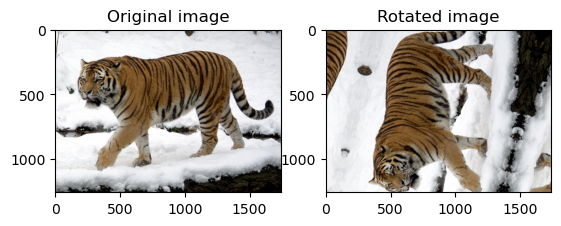

In [42]:
rand_rotation = RandomRotation(factor=(-0.2, 0.3))
apply_augmentation(img,rand_rotation,'Rotated')

Applying RandomFlip

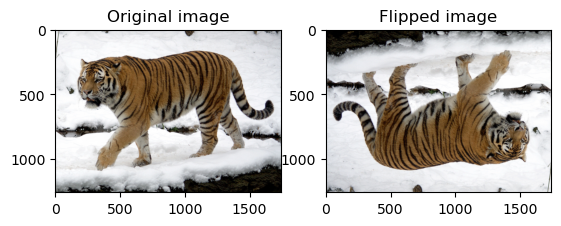

In [43]:
rand_flip = RandomFlip()
apply_augmentation(img,rand_flip,'Flipped')

Applying Random Crop

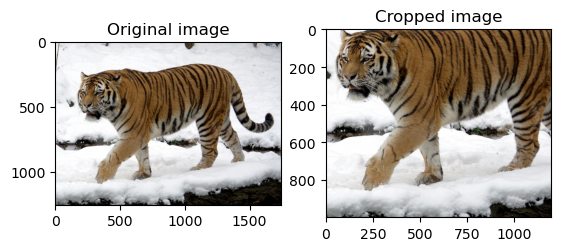

In [44]:
rand_crop = RandomCrop(height=1000,width=1200)
apply_augmentation(img,rand_crop,'Cropped')

Applying Random Contrast

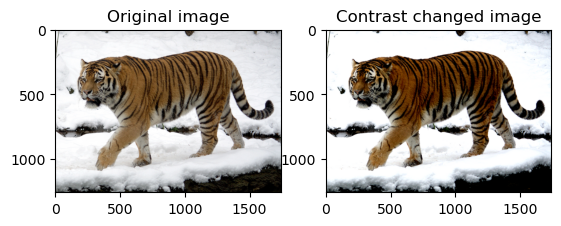

In [45]:
rand_contrast = RandomContrast(factor=(0.2,0.7))
apply_augmentation(img,rand_contrast,'Contrast changed')

Applying Random Translation

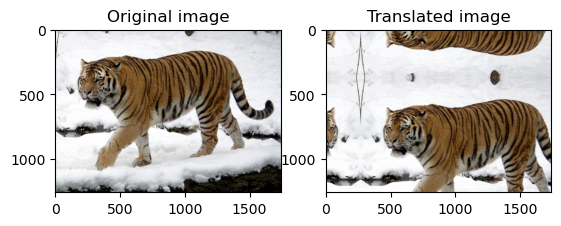

In [46]:
rand_translation = RandomTranslation(height_factor=(-0.2, 0.3),width_factor=(-0.2, 0.3))
apply_augmentation(img,rand_translation,'Translated')

Applying Random Brightness

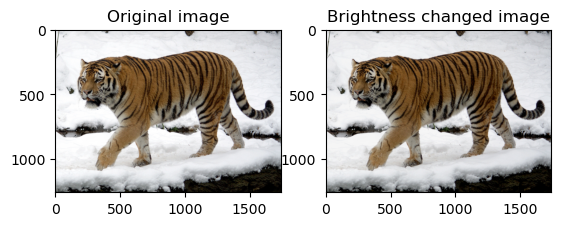

In [47]:
rand_bright = RandomBrightness(factor=(-0.2,0.8))
apply_augmentation(img,rand_bright,'Brightness changed')

Applying Augmentation to the Training Dataset

In [48]:
 def apply_train_augmentation(data):   #We will apply Augmentation from Random Crop, Random Brightness and Random Rotation to the images
    augmentation = Sequential(
        name='training_augmentation',
        layers = [
            tf.keras.layers.Resizing(height=200,width=200),
            tf.keras.layers.RandomBrightness(factor=(-0.2,0.7)),
            tf.keras.layers.RandomRotation(factor=(-0.2,0.3)),
            tf.keras.layers.RandomCrop(height=128,width=128),
            tf.keras.layers.Rescaling(1.0/255)
        ]
    )
    
    train_ds = train_data.map(lambda x,y:(augmentation(x),y),num_parallel_calls=tf.data.AUTOTUNE).prefetch(tf.data.AUTOTUNE)
    return train_ds    

In [49]:
aug_train_ds = apply_train_augmentation(train_data)

Training the model on this new Training dataset

In [50]:
aug_model = model_arch2()
aug_model.summary()

C:\Anaconda\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "cnn_model2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 126, 126, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 126, 126, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_7 (Activation)            │ (None, 126, 126, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 63, 63, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 61, 61, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 61, 61, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_8 (Activation)            │ (None, 61, 61, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 30, 30, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 28, 28, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 28, 28, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_9 (Activation)            │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 12, 12, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 12, 12, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_10 (Activation)           │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 6, 6, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 4, 4, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 4, 4, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_11 (Activation)           │ (None, 4, 4, 256)           │              

 Total params: 428,516 (1.63 MB)

 Trainable params: 427,268 (1.63 MB)

 Non-trainable params: 1,248 (4.88 KB)

Plotting the model

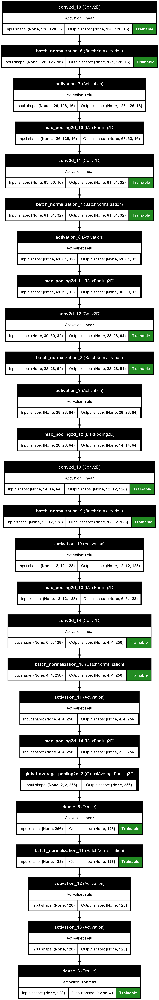

In [156]:
tf.keras.utils.plot_model(aug_model,show_shapes=True,show_layer_activations=True,show_layer_names=True,show_trainable=True)

Compiling the model for augmented data

In [51]:
aug_model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
directory = './aug_model_callbacks'
aug_model_chkpt = tf.keras.callbacks.ModelCheckpoint(f'{directory}/aug_model_chkpt/best_model.weights.h5',save_best_only=True,save_weights_only=True,monitor='val_accuracy',mode='max')
aug_model_tensorboard = tf.keras.callbacks.TensorBoard(log_dir=f'{directory}/aug_model_tensorboard',write_graph=True,write_images=True)
aug_model_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=10,min_delta=0.001,mode='min')
aug_callbacks = [aug_model_chkpt,aug_model_tensorboard,aug_model_earlystop]
aug_fitted_model = aug_model.fit(aug_train_ds,validation_data=validation_ds,batch_size=32,epochs=10,callbacks=aug_callbacks)

Epoch 1/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 39s 368ms/step - accuracy: 0.6592 - loss: 1.3569 - val_accuracy: 0.4163 - val_loss: 1.9275
Epoch 2/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 29s 356ms/step - accuracy: 0.7432 - loss: 1.1507 - val_accuracy: 0.5981 - val_loss: 1.6994
Epoch 3/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 29s 357ms/step - accuracy: 0.7434 - loss: 1.0840 - val_accuracy: 0.5167 - val_loss: 1.7463
Epoch 4/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 29s 356ms/step - accuracy: 0.7768 - loss: 0.9787 - val_accuracy: 0.5455 - val_loss: 1.4505
Epoch 5/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 1289s 17s/step - accuracy: 0.7875 - loss: 0.9216 - val_accuracy: 0.4514 - val_loss: 2.3326
Epoch 6/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 40s 494ms/step - accuracy: 0.7699 - loss: 0.9141 - val_accuracy: 0.7943 - val_loss: 0.8330
Epoch 7/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 38s 481ms/step - accuracy: 0.7768 - loss: 0.8682 - val_accuracy: 0.7879 - val_loss: 0.8079
Epoch 8/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 35s 431ms/step - accuracy: 0.8007 - loss: 0.8095 - val_accu

Plotting Training and Validation accuracy

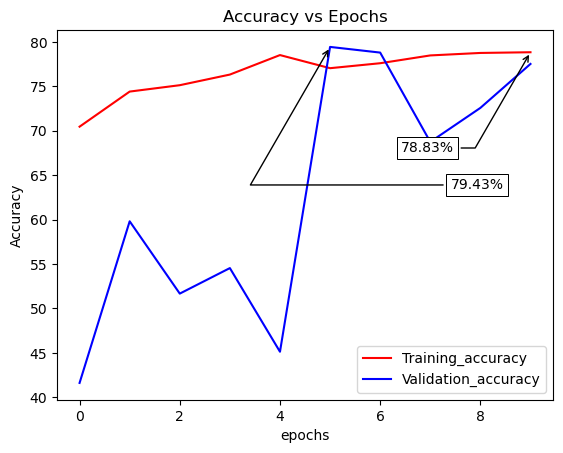

In [52]:
plot_train_val_accuracy(aug_fitted_model)

Metrics on Test Data

The accuracy of the model on the provided dataset is 71.79%



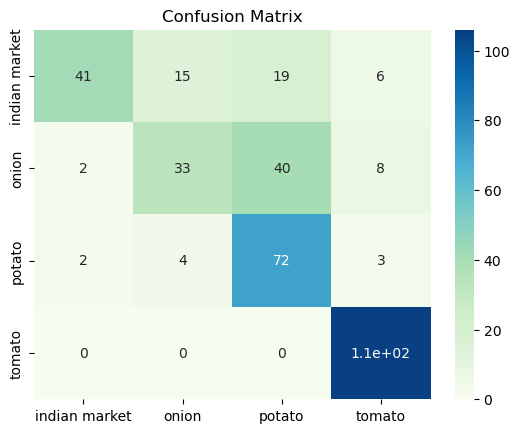

In [53]:
aug_model.load_weights(f'{directory}/aug_model_chkpt/best_model.weights.h5')
print_accuracy(aug_model,test_ds)
print()
print_confusion_matrix(aug_model,test_ds,show_plot=True)

As we have limited data to train the CNN model, we are not able to get good testing accuracy with the number of epochs equal to 10. In cases where we dont have enough training data, we can use pretrained Transfer learning models to classify our images into different classes.

In [54]:
built_models['Augmented_model']=aug_model

#### Classification using VGG 16 Model

We will use the Pre-trained VGG Net 16 model with the "Imagenet" weights and include top set as False, which will cutt off the dense layers included in the model

In [55]:
vgg_model = tf.keras.applications.VGG16(weights="imagenet",include_top=False,input_shape=(128,128,3),pooling='avg')
vgg_model.trainable=False

In [56]:
vgg_model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

In [57]:
vgg_inc_model = tf.keras.models.Sequential(
    name="vgg_included_model",
    layers = [
        vgg_model,
        tf.keras.layers.Dense(units=512,activation='relu',use_bias=True),
        tf.keras.layers.Dense(units=4,activation='softmax',use_bias=True)    #Used to classify 4 different classes.
    ]
)

In [58]:
vgg_inc_model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
vgg_inc_model.summary()

Model: "vgg_included_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ ?                           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

Plotting the model

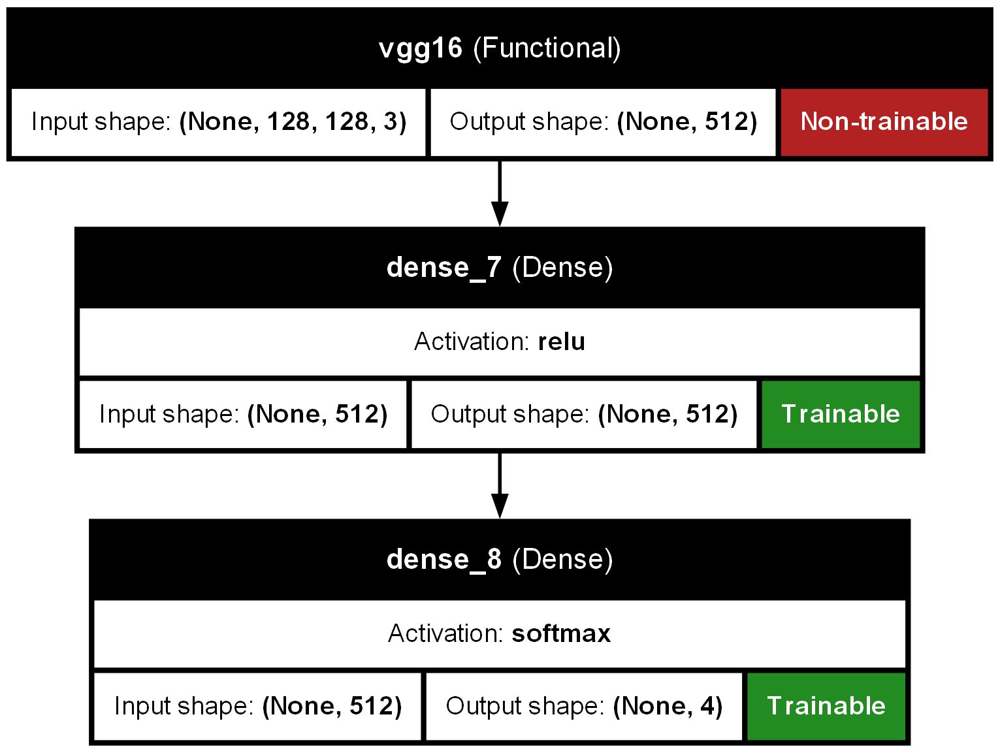

In [155]:
tf.keras.utils.plot_model(vgg_inc_model,show_shapes=True,show_layer_names=True,show_layer_activations=True,show_trainable=True)

We will Train this VGG included model on the augmented dataset

In [59]:
directory = './vgg_model_callbacks'
vgg_model_chkpt = tf.keras.callbacks.ModelCheckpoint(f'{directory}/vgg_model_chkpt/best_model.weights.h5',save_best_only=True,save_weights_only=True,monitor='val_accuracy',mode='max')
vgg_model_tensorboard = tf.keras.callbacks.TensorBoard(log_dir=f'{directory}/vgg_model_tensorboard',write_graph=True,write_images=True)
vgg_model_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=10,min_delta=0.001,mode='min')
vgg_callbacks = [vgg_model_chkpt,vgg_model_tensorboard,vgg_model_earlystop]
vgg_fitted_model = vgg_inc_model.fit(aug_train_ds,validation_data=validation_ds,batch_size=32,epochs=10,callbacks=vgg_callbacks)

Epoch 1/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 212s 3s/step - accuracy: 0.5844 - loss: 0.9864 - val_accuracy: 0.7400 - val_loss: 0.6232
Epoch 2/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 231s 3s/step - accuracy: 0.7562 - loss: 0.5966 - val_accuracy: 0.8246 - val_loss: 0.4405
Epoch 3/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 227s 3s/step - accuracy: 0.7807 - loss: 0.5445 - val_accuracy: 0.8325 - val_loss: 0.4264
Epoch 4/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 226s 3s/step - accuracy: 0.7964 - loss: 0.5052 - val_accuracy: 0.8309 - val_loss: 0.4414
Epoch 5/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 226s 3s/step - accuracy: 0.7751 - loss: 0.5153 - val_accuracy: 0.8453 - val_loss: 0.3858
Epoch 6/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 226s 3s/step - accuracy: 0.8353 - loss: 0.4270 - val_accuracy: 0.8278 - val_loss: 0.4150
Epoch 7/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 226s 3s/step - accuracy: 0.8393 - loss: 0.3949 - val_accuracy: 0.8389 - val_loss: 0.3921
Epoch 8/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 227s 3s/step - accuracy: 0.8428 - loss: 0.4052 - val_accuracy: 0.8246 - v

Training and Validation Accuracy

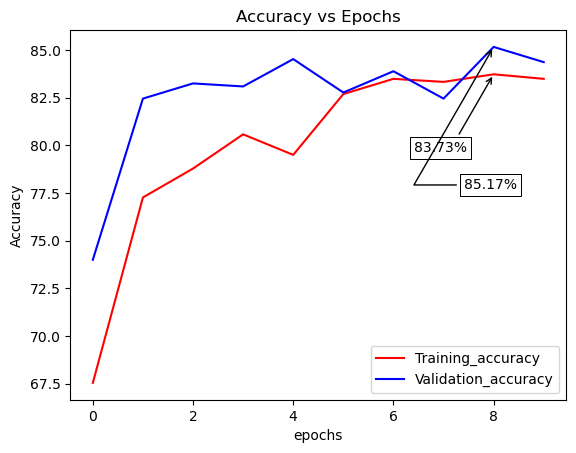

In [60]:
plot_train_val_accuracy(vgg_fitted_model)

Testing Accuracy

The accuracy of the model on the provided dataset is 81.20%



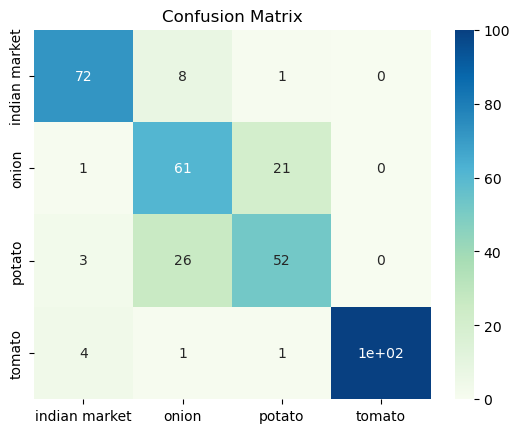

In [61]:
vgg_inc_model.load_weights(filepath=f'{directory}/vgg_model_chkpt/best_model.weights.h5')
print_accuracy(vgg_inc_model,test_ds)
print()
print_confusion_matrix(vgg_inc_model,test_ds,show_plot=True)

In [62]:
built_models['vgg_model'] = vgg_inc_model

#### Implementing CNN model using Resnet

In [63]:
from tensorflow.keras.applications import ResNet50

In [64]:
resnet_model = ResNet50(include_top=False,weights='imagenet',input_shape=(128,128,3),pooling='avg')
resnet_model.Trainable=False
resnet_model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)    │ (None, 128, 128, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 134, 134, 3)       │               0 │ input_layer_7[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 64, 64, 64)        │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_bn (BatchNormalization) │ (None, 64, 64, 64)        │             256 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_relu (Activation)       │ (None, 64, 64, 64)        │               0 │ conv1_bn[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 66, 66, 64)        │               0 │ conv1_relu[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 32, 32, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 32, 32, 64)        │           4,160 │ pool1_pool[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 32, 32, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 32, 32, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 32, 32, 64)        │          36,928 │ conv2_block1_1_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 32, 32, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 32, 32, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_0_conv (Conv2D)  │ (None, 32, 32, 256)       │          16,640 │ pool1_pool[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_3_conv (Conv2D)  │ (None, 32, 32, 256)       │          16,640 │ conv2_block1_2_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

From the summary, it can be seen that there are about 23,534,592 Trainable parameters in the RestNet 50 model

In [65]:
resnet_inc_model = tf.keras.models.Sequential(
    name='Resnet_model',
    layers = [
        resnet_model,
        tf.keras.layers.Dense(units=2048,activation='relu',use_bias=True),
        tf.keras.layers.Dense(units=4,activation='softmax',use_bias=True)
    ]
)
resnet_inc_model.summary()

Model: "Resnet_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ ?                           │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

Plotting the model

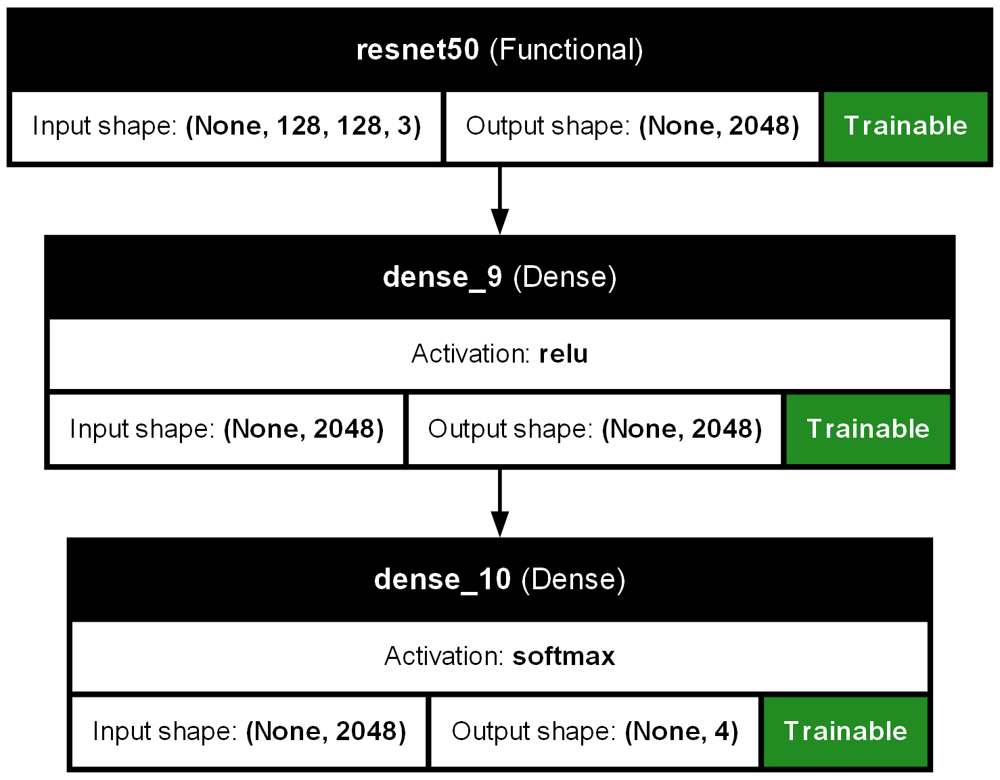

In [154]:
tf.keras.utils.plot_model(resnet_inc_model,show_shapes=True,show_layer_names=True,show_layer_activations=True,show_trainable=True)

Training the model on Augmented Training dataset ---- Setting the number of epochs as 5 as there are more Trainable parameters.

In [66]:
resnet_inc_model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
directory=f'./resnet_callbacks'
resnet_modelchkpt = tf.keras.callbacks.ModelCheckpoint(filepath=f'{directory}/resnet_modelchkpt/best_model.weights.h5',save_best_only=True,save_weights_only=True,mode='max',monitor='val_accuracy')
resnet_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',min_delta=0.001,patience=10,mode='min')
resnet_tensorboard = tf.keras.callbacks.TensorBoard(log_dir=f'{directory}/resnet_tensorboard',write_graph=True,write_images=True)
resnet_callbacks=[resnet_modelchkpt,resnet_earlystop,resnet_tensorboard]
resnet_fitted_model = resnet_inc_model.fit(aug_train_ds,validation_data=validation_ds,batch_size=32,epochs=10,callbacks=resnet_callbacks)

Epoch 1/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 466s 5s/step - accuracy: 0.6271 - loss: 1.6533 - val_accuracy: 0.2935 - val_loss: 1.9659
Epoch 2/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 348s 4s/step - accuracy: 0.7611 - loss: 0.6209 - val_accuracy: 0.2935 - val_loss: 3.5180
Epoch 3/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 335s 4s/step - accuracy: 0.8019 - loss: 0.5273 - val_accuracy: 0.2648 - val_loss: 1.5681
Epoch 4/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 339s 4s/step - accuracy: 0.8152 - loss: 0.5290 - val_accuracy: 0.2791 - val_loss: 1.3895
Epoch 5/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 335s 4s/step - accuracy: 0.8482 - loss: 0.4006 - val_accuracy: 0.2791 - val_loss: 1.4085
Epoch 6/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 339s 4s/step - accuracy: 0.8563 - loss: 0.4251 - val_accuracy: 0.2663 - val_loss: 1.5081
Epoch 7/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 339s 4s/step - accuracy: 0.8537 - loss: 0.4082 - val_accuracy: 0.4051 - val_loss: 1.2852
Epoch 8/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 338s 4s/step - accuracy: 0.8716 - loss: 0.3816 - val_accuracy: 0.2823 - v

Testing Accuracy

The accuracy of the model on the provided dataset is 75.50%



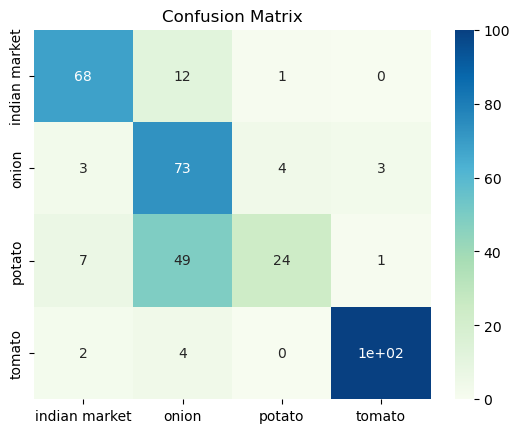

In [67]:
resnet_inc_model.load_weights(filepath=f'{directory}/resnet_modelchkpt/best_model.weights.h5')
print_accuracy(resnet_inc_model,test_ds)
print()
print_confusion_matrix(resnet_inc_model,test_ds,show_plot=True)

In [68]:
built_models['Resnet_model']=resnet_inc_model

#### Implementation with Inception net

In [69]:
from tensorflow.keras.applications import InceptionResNetV2

In [70]:
inception_net_model = InceptionResNetV2(include_top=False,weights='imagenet',input_shape=(128,128,3),pooling='avg')
inception_net_model.Trainable=False
inception_net_model.summary()

Model: "inception_resnet_v2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)    │ (None, 128, 128, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_15 (Conv2D)            │ (None, 63, 63, 32)        │             864 │ input_layer_9[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_12        │ (None, 63, 63, 32)        │              96 │ conv2d_15[0][0]            │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_14 (Activation)    │ (None, 63, 63, 32)        │               0 │ batch_normalization_12[0]… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_16 (Conv2D)            │ (None, 61, 61, 32)        │           9,216 │ activation_14[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_13        │ (None, 61, 61, 32)        │              96 │ conv2d_16[0][0]            │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_15 (Activation)    │ (None, 61, 61, 32)        │               0 │ batch_normalization_13[0]… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_17 (Conv2D)            │ (None, 61, 61, 64)        │          18,432 │ activation_15[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_14        │ (None, 61, 61, 64)        │             192 │ conv2d_17[0][0]            │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_16 (Activation)    │ (None, 61, 61, 64)        │               0 │ batch_normalization_14[0]… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_15              │ (None, 30, 30, 64)        │               0 │ activation_16[0][0]        │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_18 (Conv2D)            │ (None, 30, 30, 80)        │           5,120 │ max_pooling2d_15[0][0]     │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_15        │ (None, 30, 30, 80)        │             240 │ conv2d_18[0][0]            │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_17 (Activation)    │ (None, 30, 30, 80)        │               0 │ batch_normalization_15[0]… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_19 (Conv2D)            │ (None, 28, 28, 192)       │         138,24

 Total params: 54,336,736 (207.28 MB)

 Trainable params: 54,276,192 (207.05 MB)

 Non-trainable params: 60,544 (236.50 KB)

Creating the Sequential model

In [71]:
inception_inc_model = Sequential(
    name='inception_included_model',
    layers=[
        inception_net_model,
        tf.keras.layers.Dense(units=1536,activation='relu',use_bias=True),  #Adding only 1 dense layer at the top of the architecture.
        tf.keras.layers.Dense(units=4,activation='softmax',use_bias=True)
    ]
)

inception_inc_model.summary()

Model: "inception_included_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inception_resnet_v2 (Functional)     │ ?                           │      54,336,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 54,336,736 (207.28 MB)

 Trainable params: 54,276,192 (207.05 MB)

 Non-trainable params: 60,544 (236.50 KB)

Plotting the model

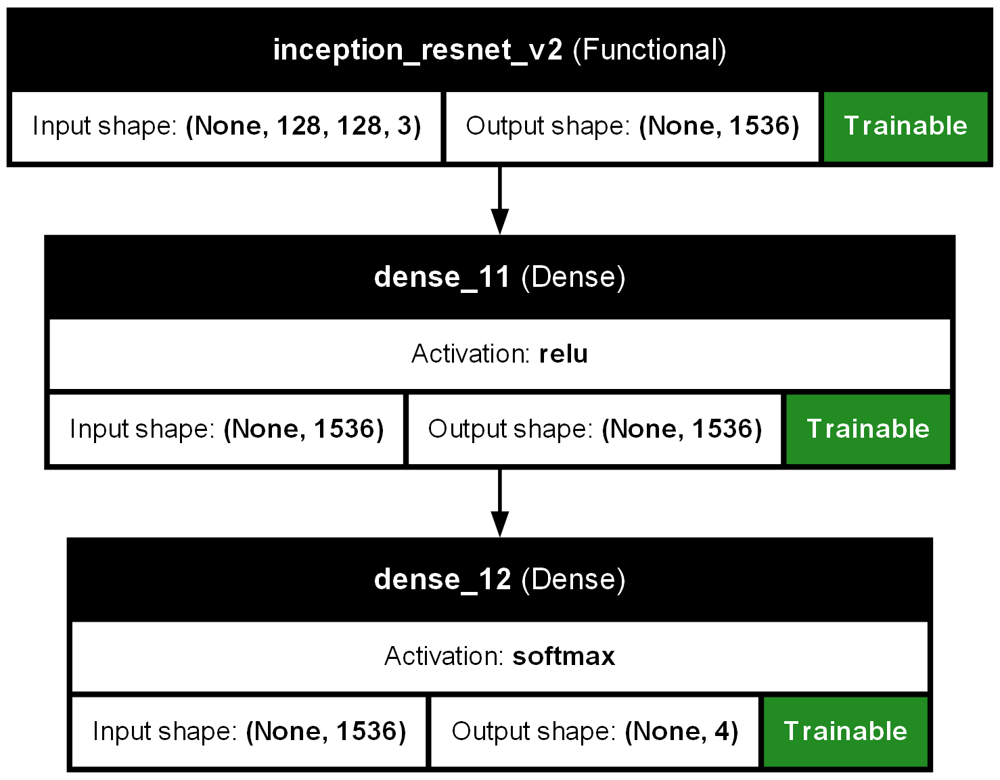

In [153]:
tf.keras.utils.plot_model(inception_inc_model,show_layer_names=True,show_trainable=True,show_layer_activations=True,show_shapes=True)

Inception Model Compilation

In [72]:
inception_inc_model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
incep_directory = './inception_model'
incep_modelchk_pt = tf.keras.callbacks.ModelCheckpoint(filepath=f'{incep_directory}/incep_modelchk/incep_best_model.weights.h5',monitor='val_accuracy',mode='max',save_best_only=True,save_weights_only=True)
incep_tensorboard = tf.keras.callbacks.TensorBoard(log_dir=f'{incep_directory}/incep_tensorboard',write_graph=True,write_images=True)
incep_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=10,mode='min',min_delta=0.001)
incep_callbacks = [incep_modelchk_pt,incep_tensorboard,incep_earlystop]
fitted_incep_model = inception_inc_model.fit(aug_train_ds,validation_data=validation_ds,epochs=10,batch_size=32,callbacks=incep_callbacks)

Epoch 1/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 660s 5s/step - accuracy: 0.6783 - loss: 1.0869 - val_accuracy: 0.5327 - val_loss: 3.3232
Epoch 2/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 420s 5s/step - accuracy: 0.8482 - loss: 0.4207 - val_accuracy: 0.7177 - val_loss: 1.0044
Epoch 3/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 441s 6s/step - accuracy: 0.8818 - loss: 0.3480 - val_accuracy: 0.8485 - val_loss: 0.4549
Epoch 4/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 404s 5s/step - accuracy: 0.8577 - loss: 0.4113 - val_accuracy: 0.7033 - val_loss: 1.6918
Epoch 5/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 401s 5s/step - accuracy: 0.8912 - loss: 0.2886 - val_accuracy: 0.7687 - val_loss: 7.4390
Epoch 6/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 393s 5s/step - accuracy: 0.8936 - loss: 0.3019 - val_accuracy: 0.6970 - val_loss: 1.5366
Epoch 7/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 416s 5s/step - accuracy: 0.8788 - loss: 0.3379 - val_accuracy: 0.8915 - val_loss: 0.2623
Epoch 8/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 387s 5s/step - accuracy: 0.8917 - loss: 0.3080 - val_accuracy: 0.5710 - v

Printing Training and Validation accuracy

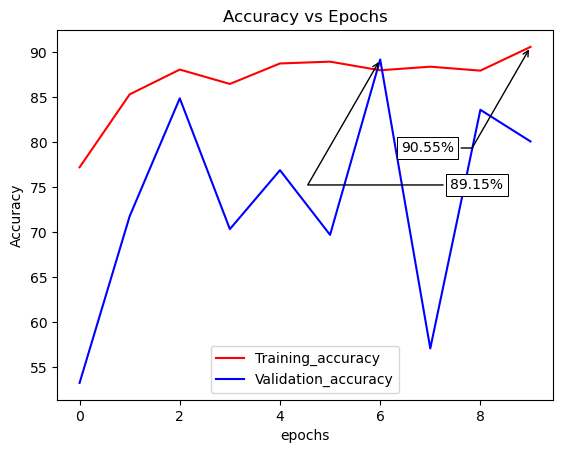

In [73]:
plot_train_val_accuracy(fitted_incep_model)

Testing accuracy and Confusion matrix

The accuracy of the model on the provided dataset is 90.60%



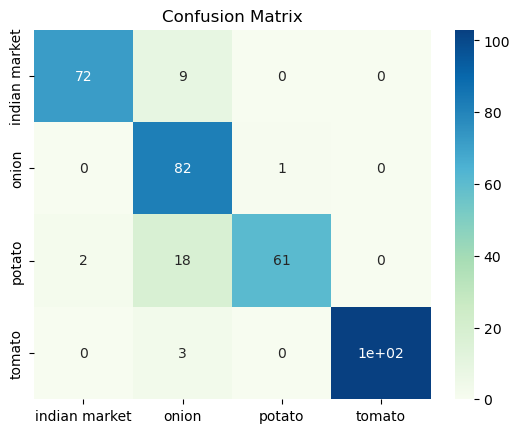

In [74]:
inception_inc_model.load_weights(filepath=f'{incep_directory}/incep_modelchk/incep_best_model.weights.h5')
print_accuracy(inception_inc_model,test_ds)
print()
print_confusion_matrix(inception_inc_model,test_ds,show_plot=True)

In [75]:
built_models['Inceptionnet_model']=inception_inc_model

#### Implementation using MobileNet architecture

In [76]:
from tensorflow.keras.applications import MobileNetV2

In [77]:
mobilenet_model = MobileNetV2(include_top=False,input_shape=(128,128,3),weights='imagenet',pooling='avg')
mobilenet_model.Trainable=False
mobilenet_model.summary()

Model: "mobilenetv2_1.00_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)   │ (None, 128, 128, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 64, 64, 32)        │             864 │ input_layer_11[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 64, 64, 32)        │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 64, 64, 32)        │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 64, 64, 32)        │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 64, 64, 32)        │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 64, 64, 32)        │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 64, 64, 16)        │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 64, 64, 16)        │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 64, 64, 96)        │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 64, 64, 96)        │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 64, 64, 96)        │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 65, 65, 96)        │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 32, 32, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 2,223,872 (8.48 MB)

 Non-trainable params: 34,112 (133.25 KB)

We can see that the MobileNet architecture has less number of trainable parameters compared to other architectures like VGGNet, ResNet, InceptionNet (GoogleNet), AlexNet.

In [78]:
mobilenet_inc_model = Sequential(
    name='mobilnet_included_model',
    layers=[
        mobilenet_model,
        tf.keras.layers.Dense(units=1280,activation='relu',use_bias=True),
        tf.keras.layers.Dense(units=4,activation='softmax',use_bias=True)
    ]
)
mobilenet_inc_model.summary()

Model: "mobilnet_included_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128 (Functional)    │ ?                           │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 2,223,872 (8.48 MB)

 Non-trainable params: 34,112 (133.25 KB)

Plotting the model

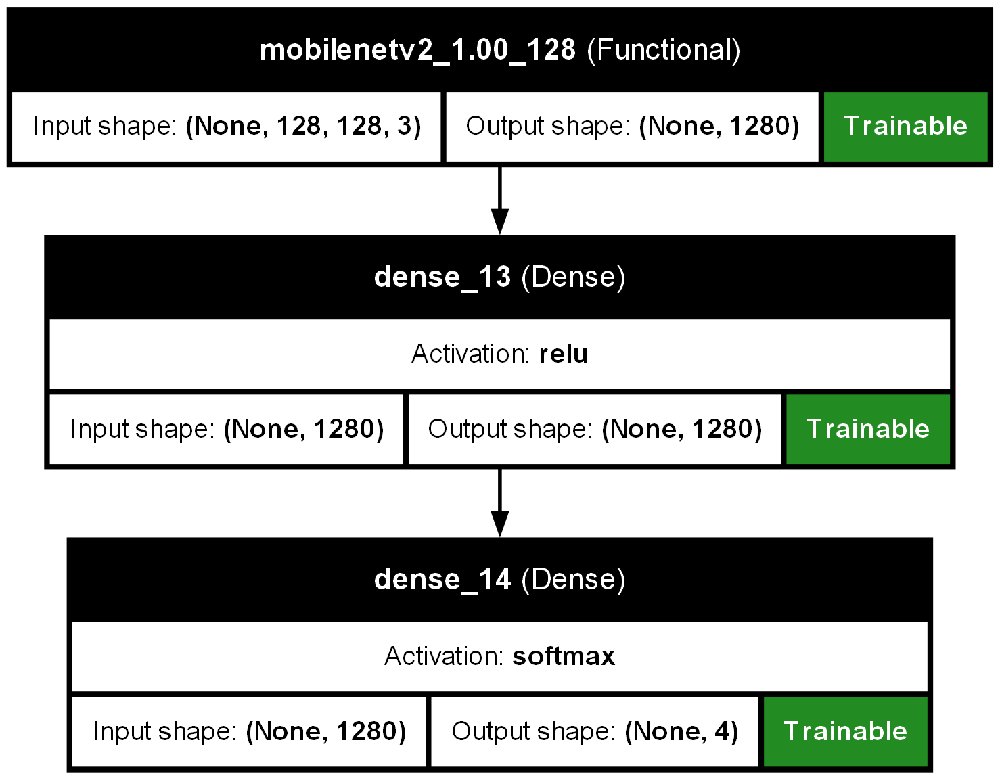

In [149]:
tf.keras.utils.plot_model(mobilenet_inc_model,show_shapes=True,show_layer_names=True,show_layer_activations=True,show_trainable=True)

Compilation of Mobilenet model

In [79]:
mobilenet_inc_model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
mobilenet_direc = './mobilenet_model'
mobile_modelchk = tf.keras.callbacks.ModelCheckpoint(filepath=f'{mobilenet_direc}/model_chkpt/best_model.weights.h5',monitor='val_accuracy',mode='max',save_best_only=True,save_weights_only=True)
mobile_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',mode='min',min_delta=0.001,patience=10)
mobile_tensorboard = tf.keras.callbacks.TensorBoard(log_dir=f'{mobilenet_direc}/model_tensorboard',write_graph=True,write_images=True)
mobile_callbacks = [mobile_modelchk,mobile_earlystop,mobile_tensorboard]
fitted_mobilenet = mobilenet_inc_model.fit(aug_train_ds,validation_data=validation_ds,epochs=10,batch_size=32,callbacks=mobile_callbacks)

Epoch 1/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 203s 2s/step - accuracy: 0.7193 - loss: 0.8404 - val_accuracy: 0.5518 - val_loss: 3.4870
Epoch 2/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - accuracy: 0.8673 - loss: 0.4362 - val_accuracy: 0.5662 - val_loss: 4.5182
Epoch 3/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - accuracy: 0.8651 - loss: 0.4498 - val_accuracy: 0.5726 - val_loss: 8.9030
Epoch 4/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 123s 2s/step - accuracy: 0.8835 - loss: 0.3469 - val_accuracy: 0.4609 - val_loss: 14.4858
Epoch 5/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 124s 2s/step - accuracy: 0.8895 - loss: 0.3120 - val_accuracy: 0.5136 - val_loss: 9.3757
Epoch 6/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 123s 2s/step - accuracy: 0.9081 - loss: 0.2475 - val_accuracy: 0.6762 - val_loss: 3.2831
Epoch 7/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - accuracy: 0.9042 - loss: 0.2727 - val_accuracy: 0.6077 - val_loss: 8.2643
Epoch 8/10
79/79 ━━━━━━━━━━━━━━━━━━━━ 122s 2s/step - accuracy: 0.9154 - loss: 0.2437 - val_accuracy: 0.4545 - 

Training and Validation Accuracy

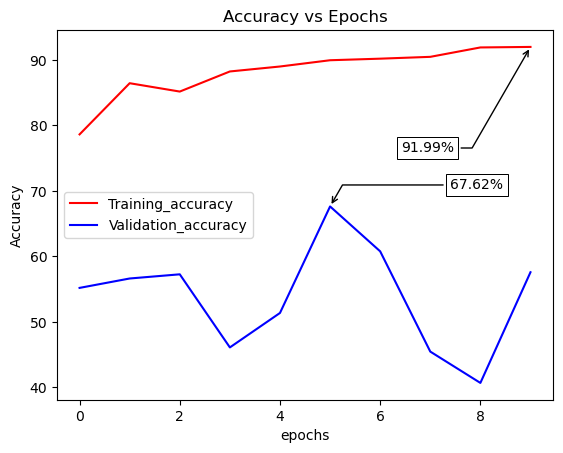

In [80]:
plot_train_val_accuracy(fitted_mobilenet)

Testing accuracy and Confusion matrix

The accuracy of the model on the provided dataset is 69.23%



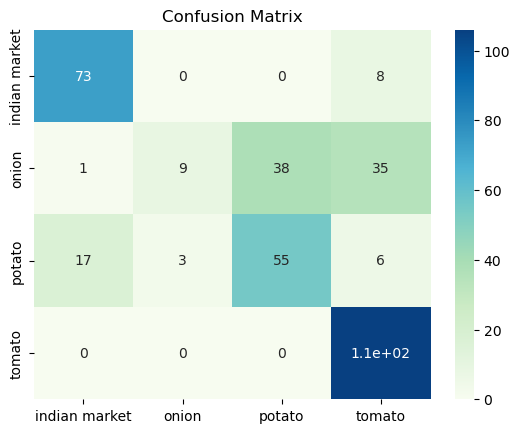

In [81]:
mobilenet_inc_model.load_weights(filepath=f'{mobilenet_direc}/model_chkpt/best_model.weights.h5')
print_accuracy(mobilenet_inc_model,test_ds)
print()
print_confusion_matrix(mobilenet_inc_model,test_ds,show_plot=True)

In [82]:
built_models['MobileNet'] = mobilenet_inc_model

##### Comparing the Models

Exception ignored in: <function WeakMethod.__new__.<locals>._cb at 0x0000018F450B0430>
Traceback (most recent call last):
  File "C:\Anaconda\lib\weakref.py", line 61, in _cb
    callback(self)
  File "C:\Anaconda\lib\site-packages\matplotlib\cbook\__init__.py", line 254, in _remove_proxy
    del self.callbacks[signal][cid]
KeyError: 'changed'


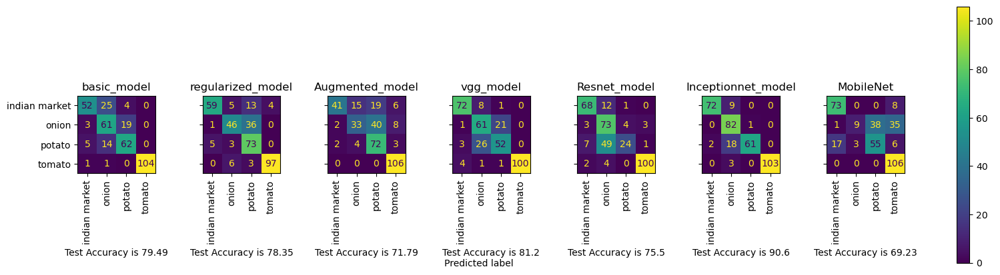

In [145]:
from sklearn.metrics import ConfusionMatrixDisplay
f, axes = plt.subplots(1, len(built_models), figsize=(20,5), sharey='row')
for ind,model in enumerate(built_models):
    test_accuracy = print_accuracy(built_models[model],test_ds,show=False).round(2)
    conf_mat = print_confusion_matrix(built_models[model],test_ds,show_plot=False)
    disp = ConfusionMatrixDisplay(conf_mat,display_labels=test_data.class_names)
    disp.plot(ax=axes[ind], xticks_rotation=90)
    disp.ax_.set_title(f'{model}')
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel(f'Test Accuracy is {test_accuracy}')
    if i!=0:
        disp.ax_.set_ylabel('')

f.text(0.4, 0.1, 'Predicted label', ha='left')
plt.subplots_adjust(wspace=0.6, hspace=0.1)


f.colorbar(disp.im_, ax=axes)
plt.show()

Out of all the models, Inception model turns out to give a good testing accuracy of 90.6%

##### Model's performance on few random images

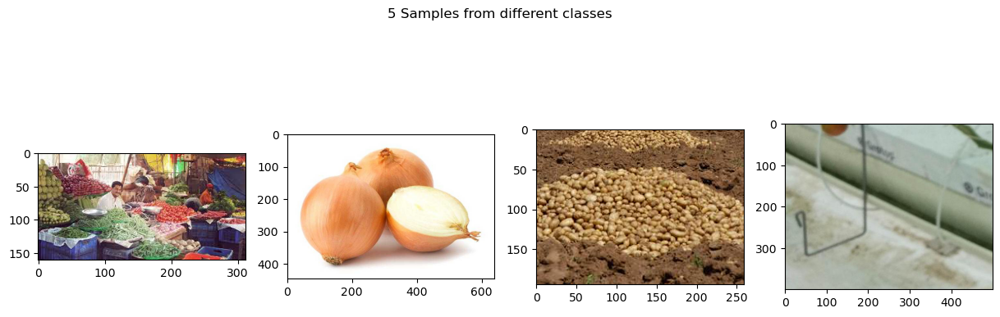

In [141]:
import random
images = []
for classes in test_data.class_names:
    directory = f'{main_directory}/test/{classes}'
    files = list(os.listdir(directory))
    img=random.choice(files)
    images.append(tf.keras.preprocessing.image.load_img(f'{directory}/{img}'))
    
plt.figure(figsize=(15,5))
for i in range(len(images)):
    plt.suptitle(f'5 Samples from different classes')
    plt.subplot(1,4,i+1)
    plt.imshow(images[i])

plt.show()

Sending these Random images into the Model and predicting its class

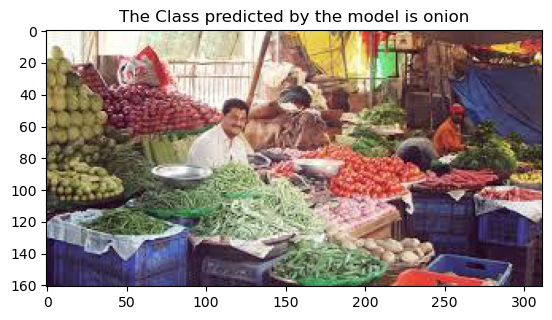

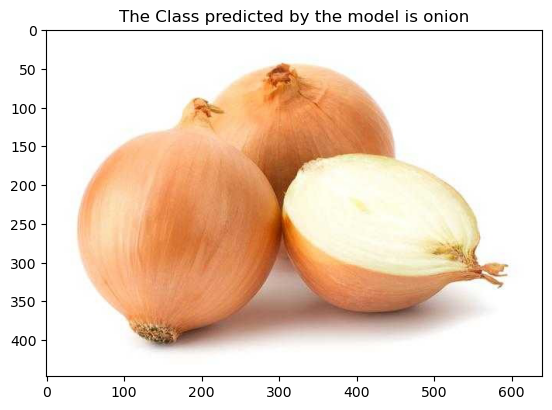

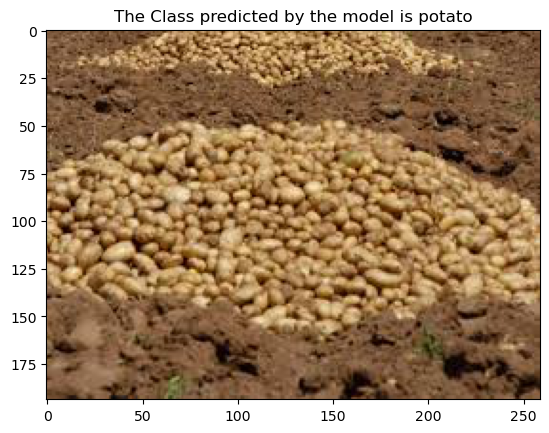

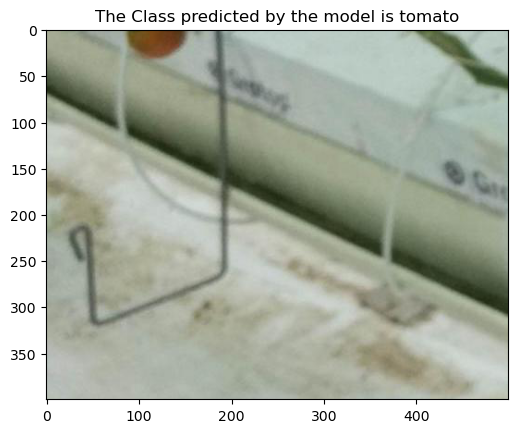

In [142]:
for img in images:
    orig_img = img
    img = tf.keras.preprocessing.image.smart_resize(img,(128,128))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img/255
    img = np.expand_dims(img,axis=0)
    best_model = built_models['Inceptionnet_model']
    prediction = best_model.predict(img,verbose=0)
    predicted_label = np.argmax(prediction)
    prediction_labels = {0:'indian market',1:'onion',2:'potato',3:'tomato'}
    plt.title(f'The Class predicted by the model is {prediction_labels[predicted_label]}')
    plt.imshow(orig_img)
    plt.show()
    print('='*100) 

##### Summary:

The model's accuracy can further be improved my Training certain layers of the transfer learning model or by including more dense layers at the top of the built network.

##### Saving the best model for easy export and import

In [144]:
built_models['Inceptionnet_model'].save("./best_model_ninjacart/inception_model.keras")